In [11]:
# Import Libraries
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from pathlib import Path
import sys
import finta
import plotly.graph_objects as go

import plotly.graph_objects as go
import yfinance as yf

def plot_bollinger_bands(stock_symbol):
    # Download historical data for the specified stock symbol
    df = yf.download(stock_symbol, start="2015-01-01", end="2023-06-07")

    # Define Bollinger Bands function
    def bollinger_bands(data, n, std, col='Close'):
        MA = data[col].rolling(window=n).mean()
        SD = data[col].rolling(window=n).std()
        data['BB_Upper'] = MA + (std * SD)
        data['BB_Lower'] = MA - (std * SD)
        return data

    # Compute Bollinger Bands with std dev of 1 and 4
    df = bollinger_bands(df, n=200, std=1)
    df.rename(columns={'BB_Upper': 'BB_Upper1', 'BB_Lower': 'BB_Lower1'}, inplace=True)
    df = bollinger_bands(df, n=200, std=4)
    df.rename(columns={'BB_Upper': 'BB_Upper4', 'BB_Lower': 'BB_Lower4'}, inplace=True)

    # Compute SMAs
    df['SMA_9'] = df['Close'].rolling(window=21).mean()
    df['SMA_21'] = df['Close'].rolling(window=50).mean()

    # Create a Candlestick trace
    trace_candle = go.Candlestick(
        x=df.index,
        open=df['Open'],
        high=df['High'],
        low=df['Low'],
        close=df['Close'], name='Candlestick',
        increasing={'line': {'color': 'green'}},
        decreasing={'line': {'color': 'red'}}
    )

    # Create traces for Bollinger Bands and SMAs
    trace_bb_upper1 = go.Scatter(x=df.index, y=df['BB_Upper1'], line={'color': 'red'}, name='BB Upper 1')
    trace_bb_lower1 = go.Scatter(x=df.index, y=df['BB_Lower1'], line={'color': 'red'}, name='BB Lower 1')
    trace_bb_upper4 = go.Scatter(x=df.index, y=df['BB_Upper4'], line={'color': 'blue'}, name='BB Upper 4')
    trace_bb_lower4 = go.Scatter(x=df.index, y=df['BB_Lower4'], line={'color': 'blue'}, name='BB Lower 4')
    trace_sma_9 = go.Scatter(x=df.index, y=df['SMA_9'], line={'color': 'green'}, name='SMA 9')
    trace_sma_21 = go.Scatter(x=df.index, y=df['SMA_21'], line={'color': 'black'}, name='SMA 21')

    # Identify points where the candlestick intersects with Bollinger Bands (std dev = 1)
    intersections_bb1 = []
    for i in range(len(df)):
        close_price = df['Close'][i]
        bb_upper1 = df['BB_Upper1'][i]
        bb_lower1 = df['BB_Lower1'][i]
        if bb_lower1 <= close_price <= bb_upper1:
            intersections_bb1.append((df.index[i], close_price))

    # Convert intersection points to DataFrame
    df_intersections_bb1 = pd.DataFrame(intersections_bb1, columns=['Date', 'Price'])

    # Identify points where the candlestick intersects with Bollinger Bands (std dev = 4)
    intersections_bb4 = []
    for i in range(len(df)):
        close_price = df['Close'][i]
        bb_upper4 = df['BB_Upper4'][i]
        bb_lower4 = df['BB_Lower4'][i]
        if bb_lower4 <= close_price <= bb_upper4:
            intersections_bb4.append((df.index[i], close_price))

    # Convert intersection points to DataFrame
    df_intersections_bb4 = pd.DataFrame(intersections_bb4, columns=['Date', 'Price'])

    # Identify points where the candlestick intersects with SMA_9
    intersections_sma9 = []
    for i in range(1, len(df)):
        close_price = df['Close'][i]
        prev_close_price = df['Close'][i-1]
        sma9 = df['SMA_9'][i]
        prev_sma9 = df['SMA_9'][i-1]
        if prev_close_price <= prev_sma9 and close_price > sma9:
            intersections_sma9.append((df.index[i], close_price))

    # Convert intersection points to DataFrame
    df_intersections_sma9 = pd.DataFrame(intersections_sma9, columns=['Date', 'Price'])

    # Identify points where the candlestick intersects with SMA_21
    intersections_sma21 = []
    for i in range(1, len(df)):
        close_price = df['Close'][i]
        prev_close_price = df['Close'][i-1]
        sma21 = df['SMA_21'][i]
        prev_sma21 = df['SMA_21'][i-1]
        if prev_close_price <= prev_sma21 and close_price > sma21:
            intersections_sma21.append((df.index[i], close_price))

    # Convert intersection points to DataFrame
    df_intersections_sma21 = pd.DataFrame(intersections_sma21, columns=['Date', 'Price'])

    print("Intersection Points with Bollinger Bands (std dev = 1):\n", df_intersections_bb1)
    print("Intersection Points with Bollinger Bands (std dev = 4):\n", df_intersections_bb4)
    print("Intersection Points with SMA 9:\n", df_intersections_sma9)
    print("Intersection Points with SMA 21:\n", df_intersections_sma21)

    layout = go.Layout(
        title={
            'text': f'{stock_symbol} Bollinger Bands and SMAs',
            'font': {
                'size': 15
            }
        },
        yaxis={
            'title': 'Price ($)',
            'showticklabels': False,
            'dtick': 1,  # Specify the desired increment for the y-axis tick marks
        },
        autosize=False,
        width=1000,
        height=800,
        xaxis={
            'rangeslider': {
                'visible': True
            },
            'rangeselector': {
                'buttons': [
                    {'count': 1, 'label': '1d', 'step': 'day', 'stepmode': 'backward'},
                    {'count': 7, 'label': '1w', 'step': 'day', 'stepmode': 'backward'},
                    {'count': 1, 'label': '1m', 'step': 'month', 'stepmode': 'backward'},
                    {'count': 3, 'label': '3m', 'step': 'month', 'stepmode': 'backward'},
                    {'count': 6, 'label': '6m', 'step': 'month', 'stepmode': 'backward'},
                    {'count': 1, 'label': 'YTD', 'step': 'year', 'stepmode': 'todate'},
                    {'count': 1, 'label': '1y', 'step': 'year', 'stepmode': 'backward'},
                    {'count': 5, 'label': '5y', 'step': 'year', 'stepmode': 'backward'},
                    {'count': 10, 'label': '10y', 'step': 'year', 'stepmode': 'backward'},
                    {'label': 'All', 'step': 'all'}
                ]
            },
            'type': 'date'
        }
    )

    fig = go.Figure(data=[trace_candle, trace_bb_upper1, trace_bb_lower1, trace_bb_upper4, trace_bb_lower4,
                          trace_sma_9, trace_sma_21], layout=layout)

    fig.show()


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Intersection Points with Bollinger Bands (std dev = 1):
           Date       Price
0   2016-01-07   97.919998
1   2016-01-08   97.330002
2   2016-01-11   97.510002
3   2016-01-12   99.370003
4   2016-01-13   95.440002
..         ...         ...
532 2023-02-24  170.389999
533 2023-02-27  169.539993
534 2023-02-28  174.940002
535 2023-03-01  173.419998
536 2023-03-02  174.529999

[537 rows x 2 columns]
Intersection Points with Bollinger Bands (std dev = 4):
            Date       Price
0    2015-10-16   97.540001
1    2015-10-19   98.470001
2    2015-10-20   97.000000
3    2015-10

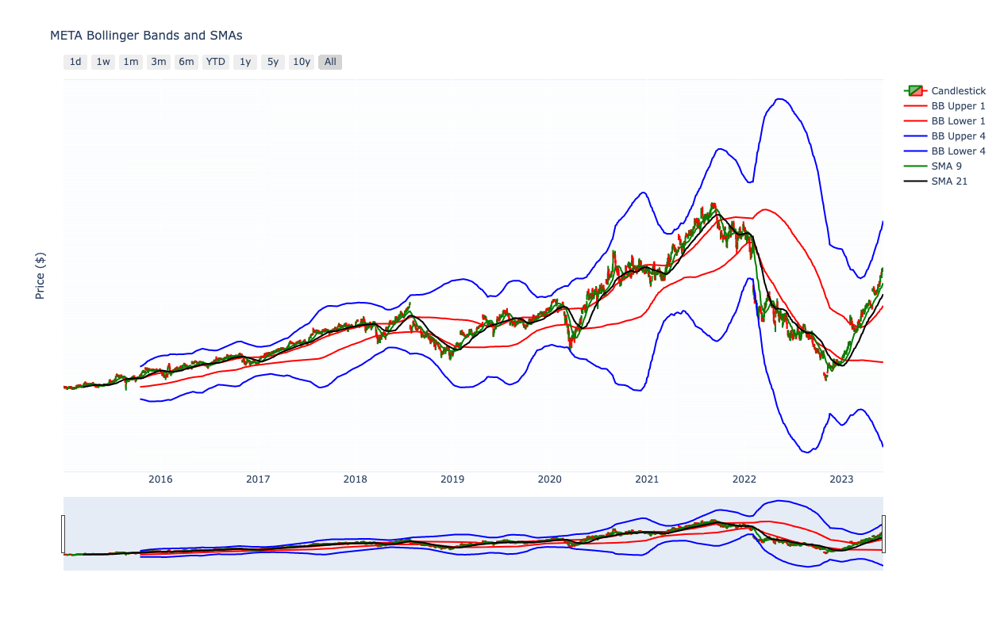

[*********************100%***********************]  1 of 1 completed
Intersection Points with Bollinger Bands (std dev = 1):
           Date       Price
0   2015-10-20   28.442499
1   2015-10-21   28.440001
2   2015-10-22   28.875000
3   2015-10-23   29.770000
4   2015-10-26   28.820000
..         ...         ...
676 2023-03-17  155.000000
677 2023-03-20  157.399994
678 2023-03-22  157.830002
679 2023-03-27  158.279999
680 2023-03-28  157.649994

[681 rows x 2 columns]
Intersection Points with Bollinger Bands (std dev = 4):
            Date       Price
0    2015-10-16   27.760000
1    2015-10-19   27.932501
2    2015-10-20   28.442499
3    2015-10-21   28.440001
4    2015-10-22   28.875000
...         ...         ...
1917 2023-05-31  177.250000
1918 2023-06-01  180.089996
1919 2023-06-02  180.949997
1920 2023-06-05  179.580002
1921 2023-06-06  179.210007

[1922 rows x 2 columns]
Intersection Points with SMA 9:
          Date       Price
0  2015-03-18   32.117500
1  2015-03-30   31.5925

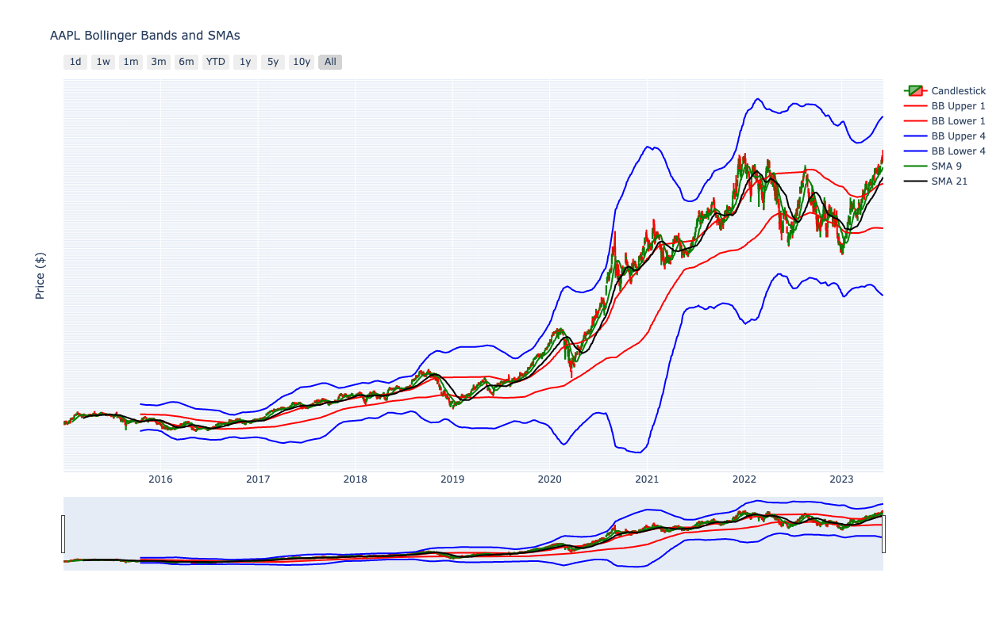

[*********************100%***********************]  1 of 1 completed
Intersection Points with Bollinger Bands (std dev = 1):
           Date       Price
0   2016-01-07   30.396999
1   2016-01-08   30.352501
2   2016-01-13   29.090500
3   2016-01-14   29.650000
4   2016-01-15   28.509001
..         ...         ...
836 2023-05-19  116.250000
837 2023-05-22  115.010002
838 2023-05-23  114.989998
839 2023-05-24  116.750000
840 2023-05-25  115.000000

[841 rows x 2 columns]
Intersection Points with Bollinger Bands (std dev = 4):
            Date       Price
0    2015-10-16   28.538000
1    2015-10-19   28.657499
2    2015-10-20   28.044001
3    2015-10-21   27.788500
4    2015-10-22   28.195499
...         ...         ...
1916 2023-05-31  120.580002
1917 2023-06-01  122.769997
1918 2023-06-02  124.250000
1919 2023-06-05  125.300003
1920 2023-06-06  126.610001

[1921 rows x 2 columns]
Intersection Points with SMA 9:
           Date       Price
0   2015-03-20   18.924500
1   2015-04-06   18.8

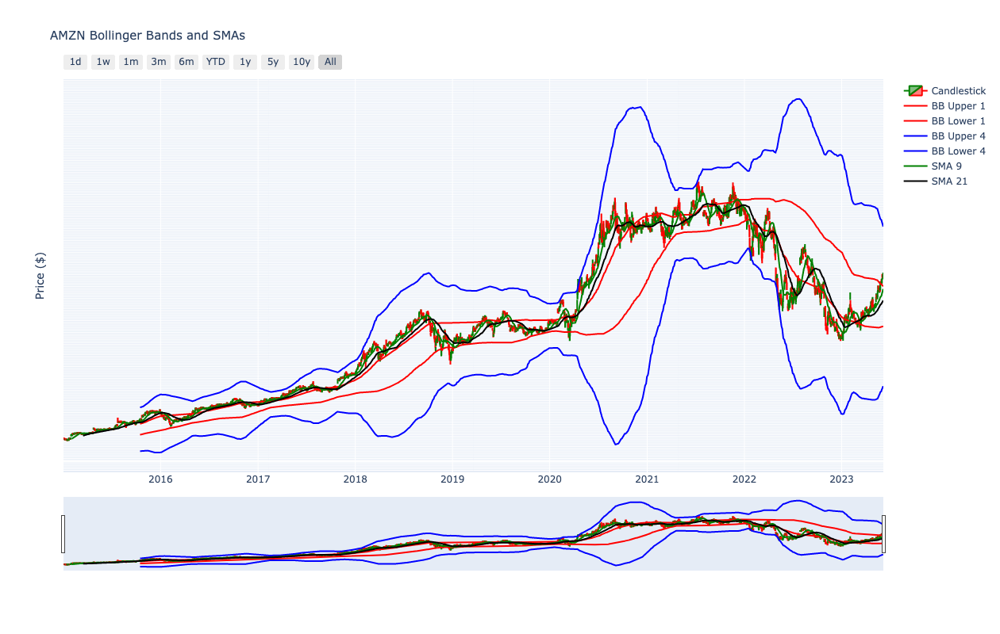

[*********************100%***********************]  1 of 1 completed
Intersection Points with Bollinger Bands (std dev = 1):
           Date       Price
0   2015-10-16   98.989998
1   2015-10-19  101.690002
2   2015-10-20   98.989998
3   2015-10-21   97.959999
4   2015-10-22   97.320000
..         ...         ...
776 2023-05-08  331.209991
777 2023-05-09  332.140015
778 2023-05-10  335.420013
779 2023-05-15  335.890015
780 2023-05-16  333.750000

[781 rows x 2 columns]
Intersection Points with Bollinger Bands (std dev = 4):
            Date       Price
0    2015-10-16   98.989998
1    2015-10-19  101.690002
2    2015-10-20   98.989998
3    2015-10-21   97.959999
4    2015-10-22   97.320000
...         ...         ...
1912 2023-05-31  395.230011
1913 2023-06-01  403.130005
1914 2023-06-02  400.470001
1915 2023-06-05  403.540009
1916 2023-06-06  399.290009

[1917 rows x 2 columns]
Intersection Points with SMA 9:
           Date       Price
0   2015-04-08   63.049999
1   2015-06-30   93.8

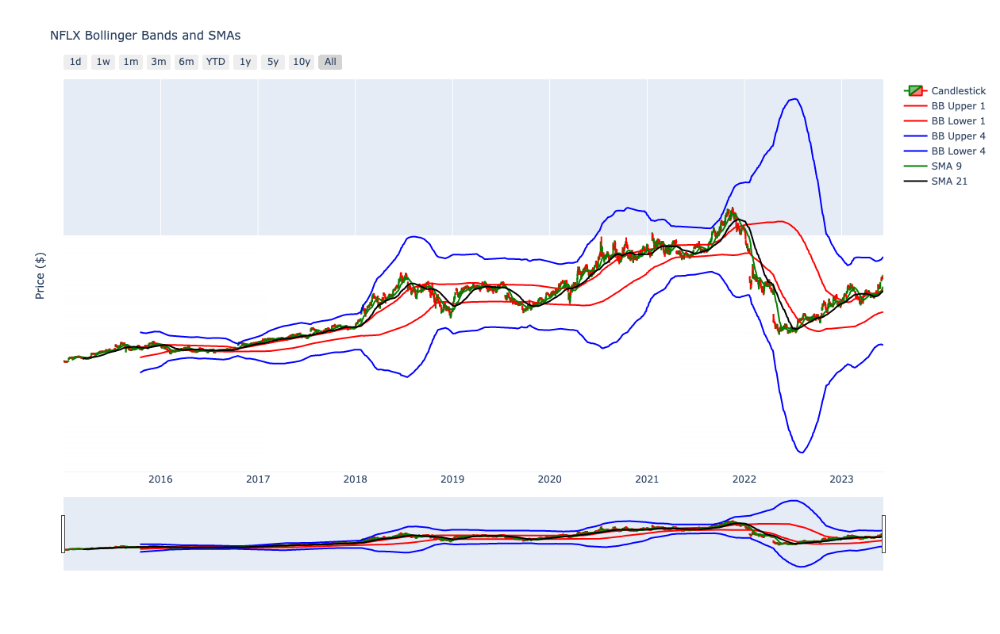

[*********************100%***********************]  1 of 1 completed
Intersection Points with Bollinger Bands (std dev = 1):
           Date       Price
0   2016-01-13   35.028000
1   2016-01-15   34.722500
2   2016-01-19   35.089500
3   2016-01-20   34.922501
4   2016-01-21   35.329498
..         ...         ...
643 2023-05-03  106.120003
644 2023-05-04  105.209999
645 2023-05-05  106.214996
646 2023-05-08  108.239998
647 2023-05-09  107.940002

[648 rows x 2 columns]
Intersection Points with Bollinger Bands (std dev = 4):
            Date       Price
0    2015-10-16   33.110001
1    2015-10-19   33.305000
2    2015-10-20   32.514000
3    2015-10-21   32.130501
4    2015-10-22   32.589500
...         ...         ...
1917 2023-05-31  123.370003
1918 2023-06-01  124.370003
1919 2023-06-02  125.230003
1920 2023-06-05  126.629997
1921 2023-06-06  127.910004

[1922 rows x 2 columns]
Intersection Points with SMA 9:
           Date       Price
0   2015-02-24   26.731110
1   2015-03-12   27.6

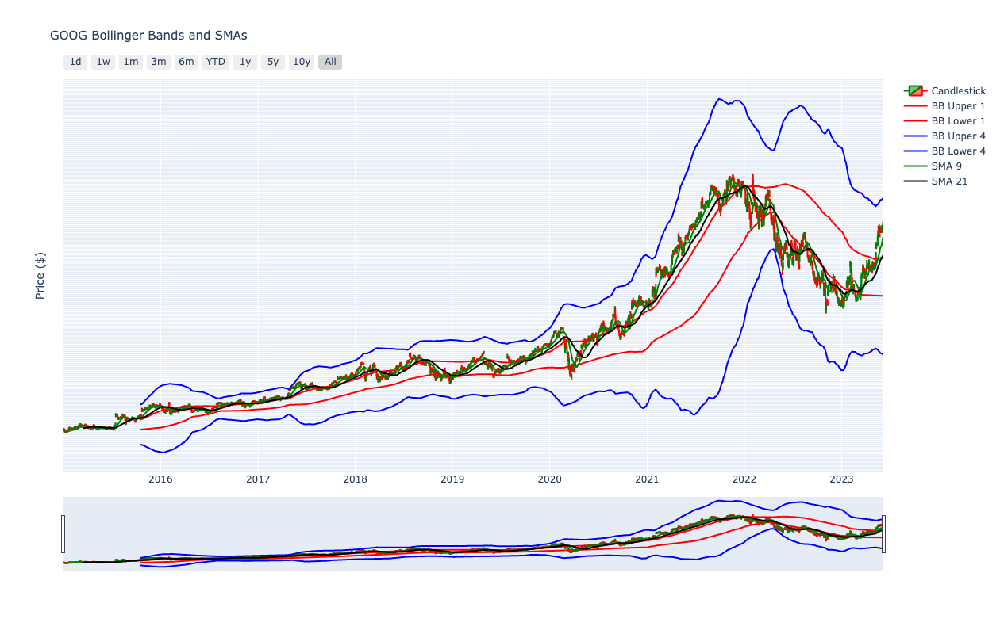

In [12]:
# Import Data from Yahoo Finance
stocks = ['META', 'AAPL', 'AMZN', 'NFLX', 'GOOG']
dfs = {}

start_date = "2021-06-01"
end_date = "2023-06-01"

for stock in stocks:
    dfs[stock] = yf.download(stock, start=start_date, end=end_date)

# Plotting Bollinger Bands and SMAs for each stock
for stock, df in dfs.items():
    plot_bollinger_bands(stock)

[*********************100%***********************]  1 of 1 completed


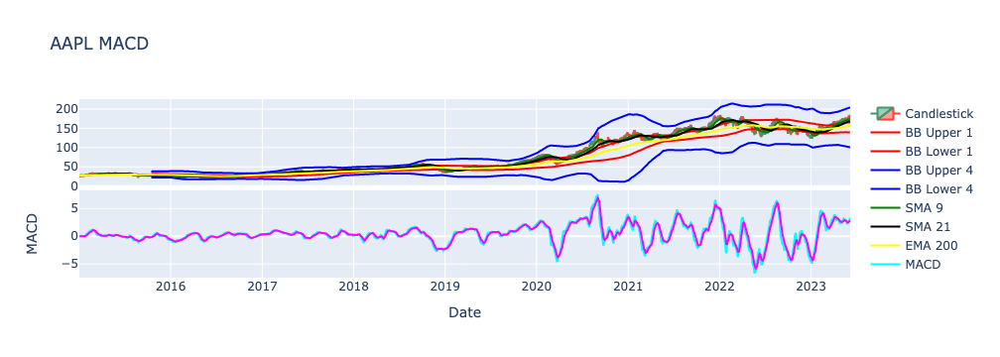

In [14]:
import yfinance as yf
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_bollinger_bands(stock_symbol):
    # Download historical data for the specified stock symbol
    df = yf.download(stock_symbol, start="2015-01-01", end="2023-06-07")

    # Define Bollinger Bands function
    def bollinger_bands(data, n, std, col='Close'):
        MA = data[col].rolling(window=n).mean()
        SD = data[col].rolling(window=n).std()
        data['BB_Upper'] = MA + (std * SD)
        data['BB_Lower'] = MA - (std * SD)
        return data
    
    # Compute MACD
    def compute_macd(data, short=12, long=26):
        short_ema = data.ewm(span=short, adjust=False).mean()
        long_ema = data.ewm(span=long, adjust=False).mean()
        macd = short_ema - long_ema
        signal = macd.ewm(span=9, adjust=False).mean()
        return macd, signal

    # Calculate Williams Fractals
    def compute_fractals(data, period=2):
        high_fractal = data['High'].rolling(window=2*period+1, center=True).max()
        low_fractal = data['Low'].rolling(window=2*period+1, center=True).min()
        data['Fractal_Bull'] = data['High'] >= high_fractal
        data['Fractal_Bear'] = data['Low'] <= low_fractal
        return data

    # Compute Bollinger Bands with std dev of 1 and 4
    df = bollinger_bands(df, n=200, std=1)
    df.rename(columns={'BB_Upper': 'BB_Upper1', 'BB_Lower': 'BB_Lower1'}, inplace=True)
    df = bollinger_bands(df, n=200, std=4)
    df.rename(columns={'BB_Upper': 'BB_Upper4', 'BB_Lower': 'BB_Lower4'}, inplace=True)

    # Compute SMAs
    df['SMA_9'] = df['Close'].rolling(window=21).mean()
    df['SMA_21'] = df['Close'].rolling(window=50).mean()
    
    # Compute EMA
    df['EMA_200'] = df['Close'].ewm(span=200, adjust=False).mean()

    # Compute MACD and MACD Signal
    df['MACD'], df['MACD_Signal'] = compute_macd(df['Close'])

    # Compute Williams Fractals
    df = compute_fractals(df, period=2)

    # Create a Candlestick chart
    trace_candle = go.Candlestick(x=df.index,
                    open=df['Open'],
                    high=df['High'],
                    low=df['Low'],
                    close=df['Close'], name='Candlestick')

    # Create traces for Bollinger Bands, SMAs, EMA
    trace_bb_upper1 = go.Scatter(x=df.index, y=df['BB_Upper1'], line={'color': 'red'}, name='BB Upper 1')
    trace_bb_lower1 = go.Scatter(x=df.index, y=df['BB_Lower1'], line={'color': 'red'}, name='BB Lower 1')
    trace_bb_upper4 = go.Scatter(x=df.index, y=df['BB_Upper4'], line={'color': 'blue'}, name='BB Upper 4')
    trace_bb_lower4 = go.Scatter(x=df.index, y=df['BB_Lower4'], line={'color': 'blue'}, name='BB Lower 4')
    trace_sma_9 = go.Scatter(x=df.index, y=df['SMA_9'], line={'color': 'green'}, name='SMA 9')
    trace_sma_21 = go.Scatter(x=df.index, y=df['SMA_21'], line={'color': 'black'}, name='SMA 21')
    trace_ema_200 = go.Scatter(x=df.index, y=df['EMA_200'], line={'color': 'yellow'}, name='EMA 200')

    # Create traces for MACD and MACD Signal
    trace_macd = go.Scatter(x=df.index, y=df['MACD'], line={'color': 'cyan'}, name='MACD')
    trace_macd_signal = go.Scatter(x=df.index, y=df['MACD_Signal'], line={'color': 'magenta'}, name='MACD Signal')

    # Create a subplot with two graphs (Candlestick and MACD)
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.02)

    # Add traces to the first graph (Candlestick)
    fig.add_trace(trace_candle, row=1, col=1)
    fig.add_trace(trace_bb_upper1, row=1, col=1)
    fig.add_trace(trace_bb_lower1, row=1, col=1)
    fig.add_trace(trace_bb_upper4, row=1, col=1)
    fig.add_trace(trace_bb_lower4, row=1, col=1)
    fig.add_trace(trace_sma_9, row=1, col=1)
    fig.add_trace(trace_sma_21, row=1, col=1)
    fig.add_trace(trace_ema_200, row=1, col=1)

    # Add traces to the second graph (MACD)
    fig.add_trace(trace_macd, row=2, col=1)
    fig.add_trace(trace_macd_signal, row=2, col=1)

    # Update layout for the first graph
    fig.update_layout(
        title=f'{stock_symbol} Bollinger Bands, SMAs, EMA',
        xaxis_rangeslider_visible=False
    )

    # Update layout for the second graph
    fig.update_layout(
        title=f'{stock_symbol} MACD',
        xaxis_rangeslider_visible=False,
        xaxis2_title='Date',
        yaxis2_title='MACD'
    )

    # Show the figure
    fig.show()


# Example usage
plot_bollinger_bands('AAPL')


In [ ]:
    
# Create a layout
    layout = go.Layout(
        title={
            'text': f'{stock_symbol} Bollinger Bands, SMAs, EMA, MACD, and Fractals',
            'font': {
                'size': 15
            }
      
            },
        
        yaxis = {
            'title': 'Price ($)',
            'tick0': 0,
            'dtick': 1,
            'showticklabels': False
            },
        
        autosize=False,
        width=1200,
        height=800,
    )

    # Construct the figure
    fig = go.Figure(
        data=[trace_candle, trace_bb_upper1, trace_bb_lower1, trace_bb_upper4, trace_bb_lower4,
              trace_sma_9, trace_sma_21, trace_ema_200], layout=layout)

    # Plot the figure
    fig.show()
 